# Script Contents
#### .01 Import Libraries & Data
#### .02 Prepare Data for Testing
#### .03 Create a Random Forest
#### .04 Investigate Feature Importances
#### .05 Random Forest of Belgrade Observations
#### .06 Random Forest of Valentia Observations
#### .07 Random Forest of Madrid Observations

## .01 Import Libraries & Data

In [57]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree

In [5]:
path = r'C:\Users\jacks\ClimateWins\02 Data Sets'

In [16]:
# Import cleaned weather data
df_clean = pd.read_csv(os.path.join(path, 'weather_clean.csv'))

In [18]:
# Import pleasant days data
df_pleasant = pd.read_csv(os.path.join(path, 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))

## .02 Prepare Data for Testing

In [21]:
df_clean.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,1,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,19600104,1,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,19600105,1,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [23]:
df_pleasant.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
#Reduce your dataset to a single decade
df_clean_2010s = df_clean[df_clean['DATE'].astype(str).str.startswith('201')]
df_clean_2010s

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18263,20100101,1,8,0.93,0.9965,0.18,0.56,0.0,2.9,-0.2,...,-7.0,1,0.80,1.0121,0.43,0.00,6.0,1.7,-1.6,5.0
18264,20100102,1,3,0.74,1.0193,0.58,0.00,5.2,-1.5,-4.2,...,-7.1,1,0.82,1.0196,0.45,0.00,6.0,0.8,-4.5,6.2
18265,20100103,1,3,0.75,1.0226,0.61,0.00,6.3,-3.2,-6.0,...,-7.1,4,0.71,1.0196,0.36,0.41,1.6,0.5,-4.1,5.1
18266,20100104,1,5,0.83,1.0169,0.48,0.00,3.7,-4.9,-8.3,...,-3.6,2,0.67,1.0219,0.48,0.51,6.5,3.7,1.3,3.8
18267,20100105,1,7,0.78,1.0073,0.53,0.04,4.4,-4.0,-7.1,...,-5.5,4,0.78,1.0117,0.45,0.09,4.7,2.3,-0.7,5.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,20191227,12,8,0.92,1.0273,0.15,0.52,0.1,6.8,5.6,...,0.2,5,0.82,1.0142,0.04,0.41,3.4,10.7,7.9,13.5
21911,20191228,12,7,0.86,1.0380,0.35,0.00,1.3,3.7,-0.6,...,-1.0,5,0.82,1.0142,0.20,0.41,3.4,10.7,7.9,13.5
21912,20191229,12,6,0.93,1.0387,0.61,0.00,4.9,-0.8,-2.7,...,5.8,5,0.82,1.0142,0.24,0.41,3.4,10.7,7.9,13.5
21913,20191230,12,1,0.81,1.0354,0.64,0.00,6.5,0.5,-3.0,...,9.6,5,0.82,1.0142,0.06,0.41,3.4,10.7,7.9,13.5


In [27]:
#Reduce your dataset to a single decade
df_pleasant_2010s = df_pleasant[df_pleasant['DATE'].astype(str).str.startswith('201')]
df_pleasant_2010s

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18263,20100101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18264,20100102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18265,20100103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18266,20100104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18267,20100105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,20191227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21911,20191228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21912,20191229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21913,20191230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [31]:
# Check if all columns have the same number of observations
all_columns_equal = df_clean_2010s.count().nunique() == 1

print(all_columns_equal)

True


In [33]:
# Check if all columns have the same number of observations
all_columns_equal = df_pleasant_2010s.count().nunique() == 1

print(all_columns_equal)

True


#### As a side note, we know from previous tasks that df_clean contains exactly 9 observation types for each weather stations

In [35]:
# Drop the DATE and MONTH columns
df_clean_2010s = df_clean_2010s.drop(['DATE','MONTH'], axis=1)
df_clean_2010s

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18263,8,0.93,0.9965,0.18,0.56,0.0,2.9,-0.2,4.8,6,...,-7.0,1,0.80,1.0121,0.43,0.00,6.0,1.7,-1.6,5.0
18264,3,0.74,1.0193,0.58,0.00,5.2,-1.5,-4.2,0.4,8,...,-7.1,1,0.82,1.0196,0.45,0.00,6.0,0.8,-4.5,6.2
18265,3,0.75,1.0226,0.61,0.00,6.3,-3.2,-6.0,1.1,7,...,-7.1,4,0.71,1.0196,0.36,0.41,1.6,0.5,-4.1,5.1
18266,5,0.83,1.0169,0.48,0.00,3.7,-4.9,-8.3,-3.1,2,...,-3.6,2,0.67,1.0219,0.48,0.51,6.5,3.7,1.3,3.8
18267,7,0.78,1.0073,0.53,0.04,4.4,-4.0,-7.1,-1.5,6,...,-5.5,4,0.78,1.0117,0.45,0.09,4.7,2.3,-0.7,5.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,8,0.92,1.0273,0.15,0.52,0.1,6.8,5.6,7.9,5,...,0.2,5,0.82,1.0142,0.04,0.41,3.4,10.7,7.9,13.5
21911,7,0.86,1.0380,0.35,0.00,1.3,3.7,-0.6,5.7,8,...,-1.0,5,0.82,1.0142,0.20,0.41,3.4,10.7,7.9,13.5
21912,6,0.93,1.0387,0.61,0.00,4.9,-0.8,-2.7,2.6,8,...,5.8,5,0.82,1.0142,0.24,0.41,3.4,10.7,7.9,13.5
21913,1,0.81,1.0354,0.64,0.00,6.5,0.5,-3.0,5.1,6,...,9.6,5,0.82,1.0142,0.06,0.41,3.4,10.7,7.9,13.5


In [37]:
# Drop the DATE column
df_pleasant_2010s = df_pleasant_2010s.drop(['DATE'], axis=1)
df_pleasant_2010s

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18263,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18264,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18265,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18266,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18267,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21911,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21912,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21913,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [112]:
# Convert df's to arrays

X = np.array(df_clean_2010s)
y = np.array(df_pleasant_2010s)

In [114]:
X.shape

(3652, 135)

In [116]:
y.shape

(3652, 15)

In [118]:
# Trying to create y shape as (3652)
# Combine 15 columns in pleasant weather data into single column
y = df_pleasant_2010s.max(axis=1)
y.shape

(3652,)

In [122]:
# Checking to make sure there are values other than 0 in my y array
for num in y:
    if num != 0:
        print(num)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [124]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [126]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739,)
(913, 135) (913,)


## .03 Create a Random Forest

In [129]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [131]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9649507119386638


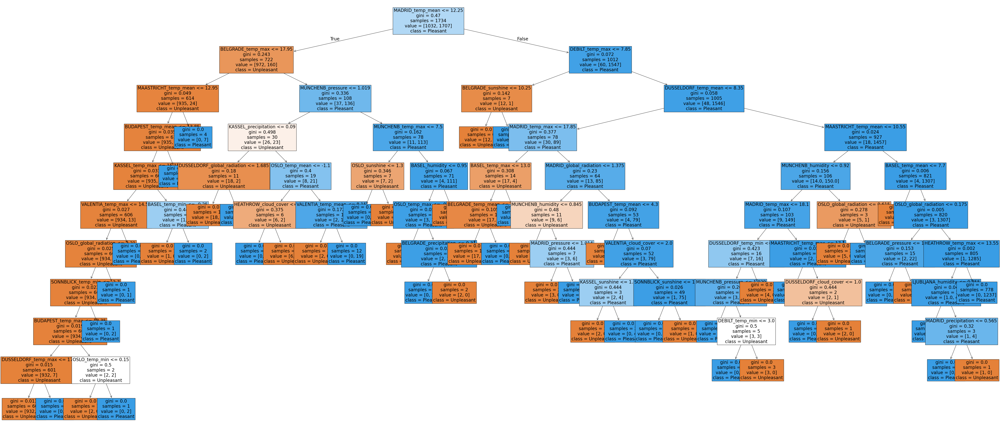

In [147]:
# Plot a tree from random forest
fig = plt.figure(figsize=(80,35))
plot_tree(clf.estimators_[5], fontsize = 20, feature_names = df_clean_2010s.columns,class_names=["Unpleasant", "Pleasant"],filled=True)
plt.show();

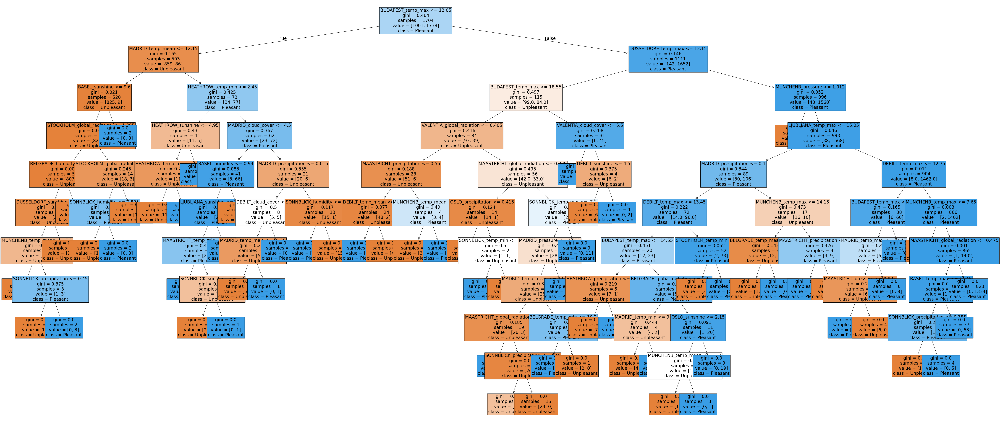

In [149]:
# Plot a different tree from random forest
fig = plt.figure(figsize=(80,35))
plot_tree(clf.estimators_[99], fontsize = 20, feature_names = df_clean_2010s.columns,class_names=["Unpleasant", "Pleasant"],filled=True)
plt.show();

## .04 Investigate Feature Importances

In [152]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([4.13236580e-04, 9.47798895e-04, 1.22806143e-03, 1.78155829e-03,
       5.27426446e-04, 7.34738239e-04, 7.54518298e-02, 6.79021487e-03,
       1.82598626e-02, 6.51749841e-04, 1.47106194e-03, 1.56479253e-03,
       1.96698492e-03, 1.73826335e-03, 1.40921059e-03, 1.87628273e-02,
       2.19769232e-03, 2.59912810e-02, 4.40179381e-04, 0.00000000e+00,
       0.00000000e+00, 5.71340044e-04, 1.41972309e-03, 7.15382009e-04,
       5.64452159e-02, 1.33464541e-02, 6.05990341e-02, 5.18090864e-04,
       8.63037034e-04, 7.12960140e-04, 2.18033445e-03, 8.96660438e-04,
       4.77517973e-04, 5.18861264e-03, 1.27267508e-03, 2.98452437e-02,
       3.56642290e-04, 1.19287830e-03, 7.76054177e-04, 3.07180671e-03,
       6.78494522e-04, 4.27228679e-04, 4.03680174e-03, 1.12780785e-03,
       2.91115889e-02, 6.43528773e-04, 1.41387558e-03, 1.36736923e-03,
       3.53412423e-03, 6.07546139e-04, 1.04485744e-03, 2.17571522e-02,
       5.91239114e-03, 1.77446388e-02, 4.33504936e-04, 5.08162476e-04,
      

In [154]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[4.13236580e-04, 9.47798895e-04, 1.22806143e-03, 1.78155829e-03,
         5.27426446e-04, 7.34738239e-04, 7.54518298e-02, 6.79021487e-03,
         1.82598626e-02],
        [6.51749841e-04, 1.47106194e-03, 1.56479253e-03, 1.96698492e-03,
         1.73826335e-03, 1.40921059e-03, 1.87628273e-02, 2.19769232e-03,
         2.59912810e-02],
        [4.40179381e-04, 0.00000000e+00, 0.00000000e+00, 5.71340044e-04,
         1.41972309e-03, 7.15382009e-04, 5.64452159e-02, 1.33464541e-02,
         6.05990341e-02],
        [5.18090864e-04, 8.63037034e-04, 7.12960140e-04, 2.18033445e-03,
         8.96660438e-04, 4.77517973e-04, 5.18861264e-03, 1.27267508e-03,
         2.98452437e-02],
        [3.56642290e-04, 1.19287830e-03, 7.76054177e-04, 3.07180671e-03,
         6.78494522e-04, 4.27228679e-04, 4.03680174e-03, 1.12780785e-03,
         2.91115889e-02],
        [6.43528773e-04, 1.41387558e-03, 1.36736923e-03, 3.53412423e-03,
         6.07546139e-04, 1.04485744e-03, 2.17571522e-02, 5.91239114

In [158]:
# Collapse this shape into one observation for each weather station
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.10613473, 0.05575386, 0.13353733, 0.04195513, 0.0407793 ,
       0.05402548, 0.0051727 , 0.12231714, 0.05599451, 0.17395101,
       0.09889342, 0.05407621, 0.00908766, 0.04394795, 0.00437355])

In [184]:
# Create a list of each location's name

def extract_unique_cities(df_clean_2010s):
  """
  Extracts unique city names from a pandas DataFrame 
  where column names are in the format "CITY_measurement".

  Args:
    df: The pandas DataFrame.

  Returns:
    A list of unique city names.
  """

  city_names = [col.split('_')[0] for col in df_clean_2010s.columns]
  unique_cities = list(set(city_names)) 
  return unique_cities

unique_city_list = extract_unique_cities(df_clean_2010s)
print(unique_city_list) 

['BUDAPEST', 'DEBILT', 'VALENTIA', 'MUNCHENB', 'SONNBLICK', 'STOCKHOLM', 'DUSSELDORF', 'MADRID', 'KASSEL', 'BELGRADE', 'OSLO', 'LJUBLJANA', 'BASEL', 'HEATHROW', 'MAASTRICHT']


In [186]:
important = pd.Series(sumarray, index = unique_city_list).sort_values(ascending = False)
important

BELGRADE      0.173951
VALENTIA      0.133537
MADRID        0.122317
BUDAPEST      0.106135
OSLO          0.098893
KASSEL        0.055995
DEBILT        0.055754
LJUBLJANA     0.054076
STOCKHOLM     0.054025
HEATHROW      0.043948
MUNCHENB      0.041955
SONNBLICK     0.040779
BASEL         0.009088
DUSSELDORF    0.005173
MAASTRICHT    0.004374
dtype: float64

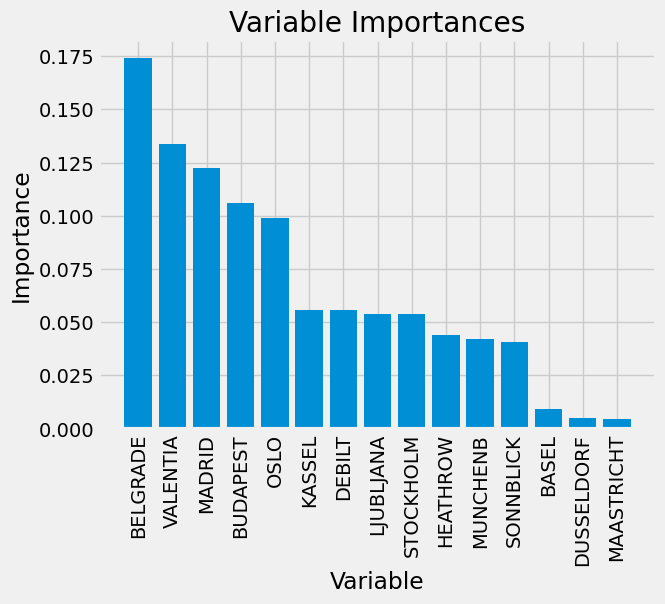

In [190]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, important.index, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### The top 3 stations in order of importance for model influence are Belgrade, Valentia, and Madrid. 

## .05 Random Forest of Belgrade Observations

In [198]:
# Filter weather dataset to only include Belgrade
df_belgrade = df_clean[df_clean.columns[df_clean.columns.astype(str).str.startswith('BELGRADE')]]
df_belgrade.head()

,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max
0,1,0.81,1.0195,0.88,0.00,7.0,3.7,-0.9,7.9
1,6,0.84,1.0172,0.25,0.00,0.0,2.9,2.2,4.4
2,6,0.77,1.0179,0.67,0.00,3.5,3.1,-0.5,6.4
3,8,0.93,1.0268,0.25,0.00,0.0,2.0,-2.0,3.0
4,8,0.99,1.0286,0.25,0.06,0.0,2.0,0.7,2.8


In [204]:
df_belgrade.shape

(22950, 9)

In [206]:
# Filter pleasant dataset to only include Belgrade
df_pleasant_belgrade = df_pleasant[df_pleasant.columns[df_pleasant.columns.astype(str).str.startswith('BELGRADE')]]
df_pleasant_belgrade.head()

,BELGRADE_pleasant_weather
0,0
1,0
2,0
3,0
4,0


In [208]:
df_pleasant_belgrade.shape

(22950, 1)

In [211]:
# Convert df's to arrays

X = np.array(df_belgrade)
y = np.array(df_pleasant_belgrade)

In [213]:
X.shape

(22950, 9)

In [215]:
y.shape

(22950, 1)

In [217]:
# Trying to create y shape as (22950)
# Combine 15 columns in pleasant weather data into single column
y = df_pleasant_belgrade.max(axis=1)
y.shape

(22950,)

In [219]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [221]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [223]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [225]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


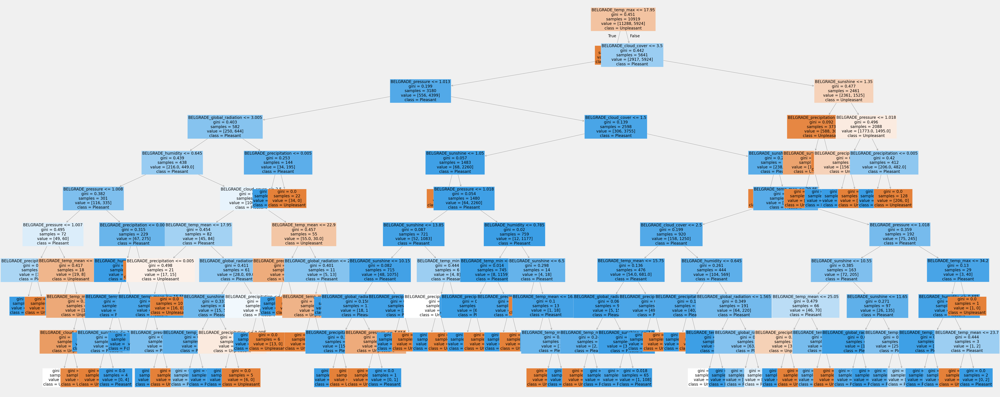

In [231]:
# Plot a tree from random forest
fig = plt.figure(figsize=(80,35))
plot_tree(clf.estimators_[5], fontsize = 20, feature_names = df_belgrade.columns,class_names=["Unpleasant", "Pleasant"],filled=True)
plt.show();

In [233]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.0436827 , 0.00984667, 0.0073153 , 0.05791302, 0.35599426,
       0.0712659 , 0.14858323, 0.03320387, 0.27219504])

In [235]:
# Create a list of observation types
observations = [feature.replace('BELGRADE_', '') for feature in df_belgrade]
observations

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [239]:
important = pd.Series(newarray, index = observations).sort_values(ascending = False)
important

precipitation       0.355994
temp_max            0.272195
temp_mean           0.148583
sunshine            0.071266
global_radiation    0.057913
cloud_cover         0.043683
temp_min            0.033204
humidity            0.009847
pressure            0.007315
dtype: float64

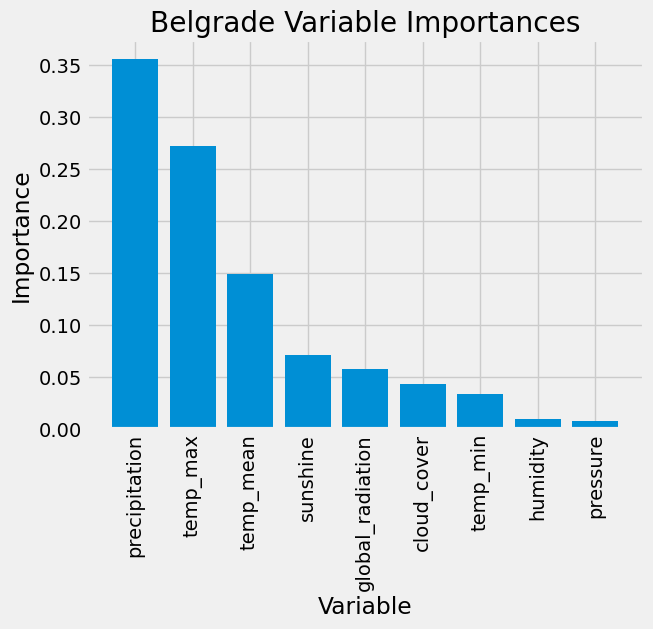

In [243]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, important.index, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Belgrade Variable Importances');

## .06 Random Forest of Valentia Observations

In [246]:
# Filter weather dataset to only include Valentia
df_valentia = df_clean[df_clean.columns[df_clean.columns.astype(str).str.startswith('VALENTIA')]]
df_valentia.head()

,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [248]:
df_valentia.shape

(22950, 9)

In [250]:
# Filter pleasant dataset to only include Belgrade
df_pleasant_valentia = df_pleasant[df_pleasant.columns[df_pleasant.columns.astype(str).str.startswith('VALENTIA')]]
df_pleasant_valentia.head()

,VALENTIA_pleasant_weather
0,0
1,0
2,0
3,0
4,0


In [252]:
df_pleasant_valentia.shape

(22950, 1)

In [254]:
# Convert df's to arrays

X = np.array(df_valentia)
y = np.array(df_pleasant_valentia)

In [256]:
X.shape

(22950, 9)

In [258]:
y.shape

(22950, 1)

In [260]:
# Trying to create y shape as (22950)
# Combine 15 columns in pleasant weather data into single column
y = df_pleasant_valentia.max(axis=1)
y.shape

(22950,)

In [262]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [264]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [266]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [268]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


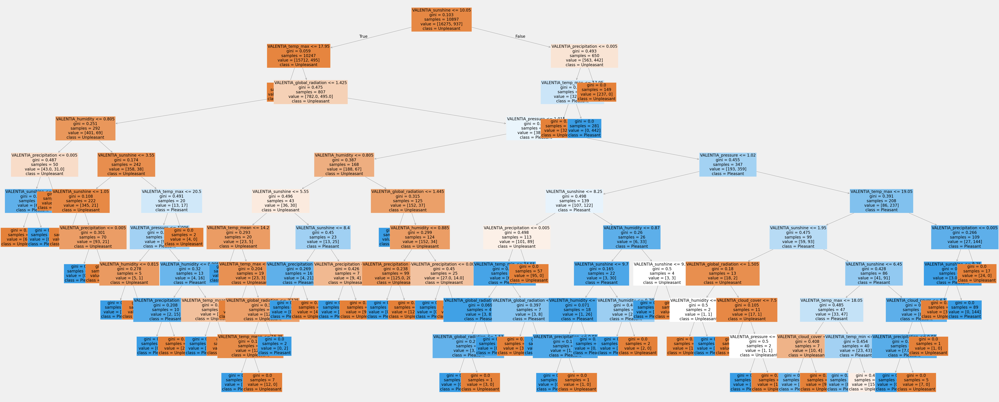

In [270]:
# Plot a tree from random forest
fig = plt.figure(figsize=(80,35))
plot_tree(clf.estimators_[5], fontsize = 20, feature_names = df_valentia.columns,class_names=["Unpleasant", "Pleasant"],filled=True)
plt.show();

In [272]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.02810959, 0.00541731, 0.02223844, 0.0237355 , 0.27689412,
       0.09792897, 0.08685211, 0.01781762, 0.44100633])

In [276]:
# Create a list of observation types
observations = [feature.replace('VALENTIA_', '') for feature in df_valentia]
observations

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [278]:
important = pd.Series(newarray, index = observations).sort_values(ascending = False)
important

temp_max            0.441006
precipitation       0.276894
sunshine            0.097929
temp_mean           0.086852
cloud_cover         0.028110
global_radiation    0.023735
pressure            0.022238
temp_min            0.017818
humidity            0.005417
dtype: float64

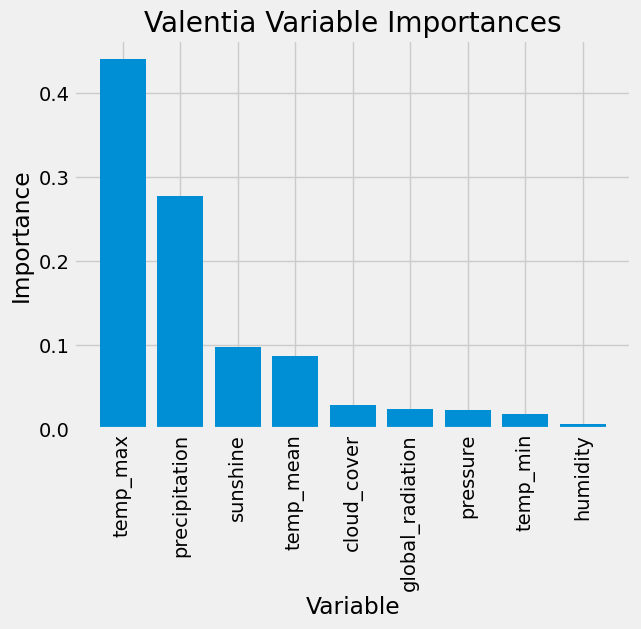

In [280]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, important.index, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Valentia Variable Importances');

## .07 Random Forest of Madrid Observations

In [283]:
# Filter weather dataset to only include Madrid
df_madrid = df_clean[df_clean.columns[df_clean.columns.astype(str).str.startswith('MADRID')]]
df_madrid.head()

,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,6,0.92,1.0260,0.53,0.0,1.4,7.6,4.4,10.8
1,7,0.86,1.0254,0.46,0.0,0.9,9.8,7.4,12.2
2,5,0.90,1.0287,0.63,0.0,2.3,8.6,6.4,10.8
3,0,0.75,1.0281,1.16,0.0,8.7,10.3,4.5,16.1
4,2,0.64,1.0269,1.10,0.0,7.8,12.1,8.2,16.0


In [285]:
df_madrid.shape

(22950, 9)

In [287]:
# Filter pleasant dataset to only include Belgrade
df_pleasant_madrid = df_pleasant[df_pleasant.columns[df_pleasant.columns.astype(str).str.startswith('MADRID')]]
df_pleasant_madrid.head()

,MADRID_pleasant_weather
0,0
1,0
2,0
3,0
4,0


In [289]:
df_pleasant_madrid.shape

(22950, 1)

In [291]:
# Convert df's to arrays

X = np.array(df_madrid)
y = np.array(df_pleasant_madrid)

In [293]:
X.shape

(22950, 9)

In [295]:
y.shape

(22950, 1)

In [297]:
# Trying to create y shape as (22950)
# Combine 15 columns in pleasant weather data into single column
y = df_pleasant_madrid.max(axis=1)
y.shape

(22950,)

In [299]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [301]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [303]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=10)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [305]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


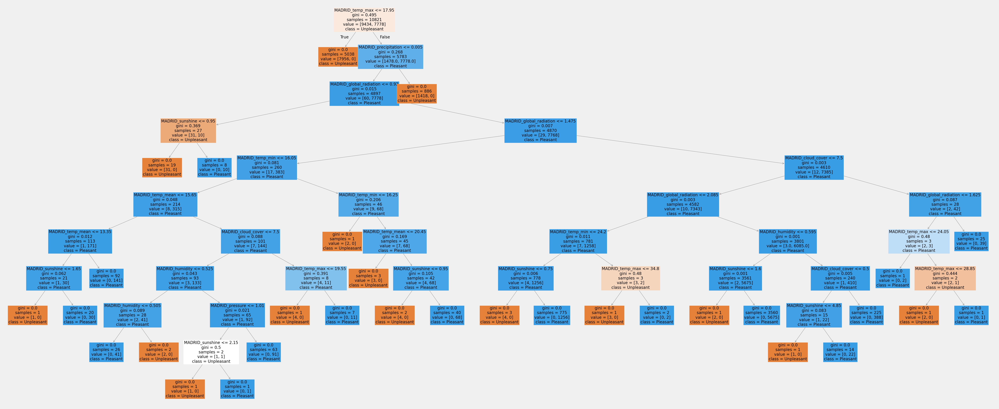

In [307]:
# Plot a tree from random forest
fig = plt.figure(figsize=(80,35))
plot_tree(clf.estimators_[5], fontsize = 20, feature_names = df_madrid.columns,class_names=["Unpleasant", "Pleasant"],filled=True)
plt.show();

In [309]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.01313335, 0.02465704, 0.00363426, 0.07308572, 0.21628623,
       0.09065347, 0.21537675, 0.0232695 , 0.33990367])

In [311]:
# Create a list of observation types
observations = [feature.replace('MADRID_', '') for feature in df_madrid]
observations

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [313]:
important = pd.Series(newarray, index = observations).sort_values(ascending = False)
important

temp_max            0.339904
precipitation       0.216286
temp_mean           0.215377
sunshine            0.090653
global_radiation    0.073086
humidity            0.024657
temp_min            0.023270
cloud_cover         0.013133
pressure            0.003634
dtype: float64

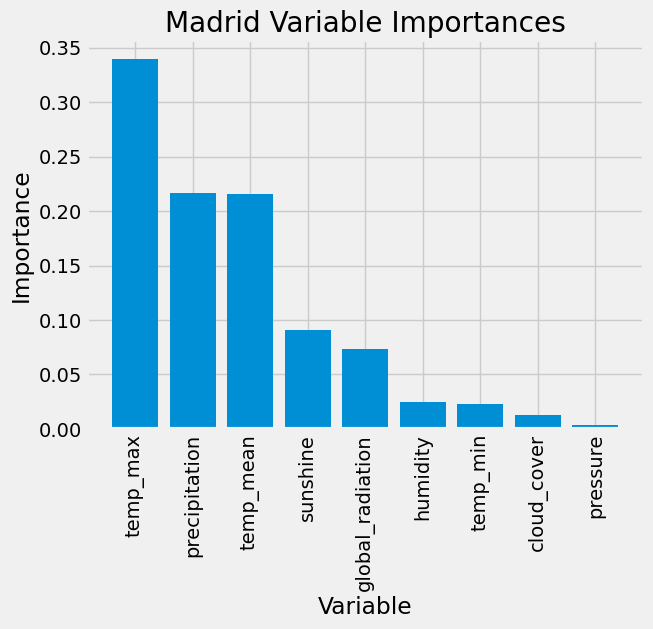

In [315]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, important.index, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Madrid Variable Importances');